In [1]:
# Ali Hajisadeghian
# 402211734

# Computer Vision Project
#### Introduction to Machine learning course | Instructor: Dr. Fatemeh Mirsalehi

<font color='cyan'> Responsible TA: Amirhossein Razlighi </font>

In [2]:
%pip install torch torchvision numpy matplotlib Pillow

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.0 -> 24.1.1
[notice] To update, run: C:\Users\Ali\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [3]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt

## Section 1: Implementing a CNN from scratch! (30 points)

### 1.1 - Forward and Backward (20/30 pts)

__CNN__ s are powerfull tools to work with in the scope of _Computer Vision_. You have seen MLPs before and know how to do forward and backward pass on them. In this part, we want to create a convolutional layer (a simple one, of course!) just to understand well that how a Convolutional Layer works, behind the scenes. Then, we can simply use PyTorch's `Conv2D` layer for the rest of this project, because we understood that how Convolutions work, behind the scene!

__FORWARD PASS__:

In forward pass, you should apply the convolution operation on the input image. The convolution operation is as follows:

$$
\text{output}[i, j] = \sum_{k=0}^{K-1} \sum_{l=0}^{L-1} \text{input}[i+k, j+l] \times \text{kernel}[k, l]
$$

You can see a sample convolution operation (with a $3 \times 3$ kernel) in the following image:
<div style="text-align:center;">
  <img src="./Images/Conv.gif" /> 
</div>

Please note that, these are samples for you to understand the operation better. For _forward pass_ that you should implement, please notice that you should convolve the kernel along all $C$ channels of the input image. So, the output shape should be $(N, H_{out}, W_{out})$. These values are calculated as follows:

$$
H_{out} = \frac{H_{in} + 2 \times \text{padding}}{\text{stride} - HH} + 1
$$
$$
W_{out} = \frac{W_{in} + 2 \times \text{padding}}{\text{stride} - WW} + 1
$$


where $HH$ and $WW$ are the height and width of the kernel, respectively. __stride__ is the step size of the kernel, and __padding__ is the number of zeros that should be padded to the input image. Please also note that $b$ stands for bias, which is a scalar value that should be added to the output of the convolution operation. (for each kernel)

You can see a more detailed example, below:

<div style="text-align:center;">
  <img src="./Images/conv3.gif" /> 
</div>

__Backward Pass__:

In backward pass, you should calculate gradient of output with respect to the input image and the kernel. These gradients will be used in _optimization_ to update kernel weights. (You saw something similar, in using MLPs with gradient descent algorithm!). So, we need $d_x$, $d_w$ and $d_b$ in the backward pass. These are calculated as follows:

$$
dx_{padded} [n, :, i * stride: i * stride + HH, j * stride: j * stride + WW] += w[f] \times dout[n, f, i, j]
$$

$$
dw_{f} = \sum_{n=0}^{N - 1} \sum_{i=0}^{H_{out} - 1} \sum_{j=0}^{W_{out} - 1} x_{padded}[n, :, i * stride: i * stride + HH, j * stride: j * stride + WW] \times dout[n, f, i, j]  
$$

$$
db_{f} = \sum_{n=0}^{N - 1} \sum_{i=0}^{H_{out} - 1} \sum_{j=0}^{W_{out} - 1} dout[n, f, i, j]
$$

For better understanding of the backward pass, you can see the following image:

<div style="text-align:center;">
  <img src="./Images/backprop_cs231n.png" />
</div>


In [4]:
import numpy as np


class MyConv:
    def __init__(self, stride, padding):
        self.stride = stride
        self.padding = padding

    def forward(self, x, w, b):
        out = None

        ####### TO DO : Implement Forward pass of Conv2D #######
        ########################################################

        N, C, H, W = x.shape
        F, C, HH, WW = w.shape
        pad = self.padding
        stride = self.stride
        H_out = 1 + (H + 2 * pad - HH) // stride
        W_out = 1 + (W + 2 * pad - WW) // stride

        x_pad = np.pad(x, ((0, 0), (0, 0), (pad, pad), (pad, pad)), mode='constant')
        out = np.zeros((N, F, H_out, W_out))

        for n in range(N):
            for f in range(F):
                for k in range(H_out):
                    for l in range(W_out):
                        out[n, f, k, l] = np.sum(x_pad[n, :, k*stride:k*stride+HH, l*stride:l*stride+WW] * w[f]) + b[f]

        ####### TO DO : End #######
        #############################

        cache = (x, w, b, x_pad)
        self.cache = cache
        return out

    def backward(self, dout):
        dx, dw, db = None, None, None

        x, w, b, x_padded = self.cache

        ####### TO DO : Implement backward pass #######
        ###############################################

        N, C, H, W = x.shape
        F, C, HH, WW = w.shape
        N, F, H_OUT, W_OUT = dout.shape

        dw = np.zeros_like(w)
        dx = np.zeros_like(x)
        db = np.zeros_like(b)

        dx_padded = np.zeros_like(x_padded)

        for n in range(N):
            for f in range(F):
                for i in range(H_OUT):
                    for j in range(W_OUT):
                        dw[f] += dout[n, f, i, j] * x_padded[n, :, i * self.stride:i * self.stride + HH, j * self.stride:j * self.stride + WW]
                        dx_padded[
                            n,
                            :,
                            i * self.stride : i * self.stride + HH,
                            j * self.stride : j * self.stride + WW,
                        ] += dout[n, f, i, j] * w[f]
                        db[f] += dout[n, f, i, j]

        dx = dx_padded[:, :, self.padding:-self.padding, self.padding:-self.padding]
        db = db.reshape(F)

        ####### TO DO : End #######
        #############################

        self.dx = dx
        self.dw = dw
        self.db = db
        return dx, dw, db


In [5]:
def rel_error(x, y):
  return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

In [6]:
# A simple test for forward pass (DO NOT CHANGE)

x_shape = (2, 3, 4, 4)
w_shape = (3, 3, 4, 4)
x = np.linspace(-0.1, 0.5, num=np.prod(x_shape)).reshape(x_shape)
w = np.linspace(-0.2, 0.3, num=np.prod(w_shape)).reshape(w_shape)
b = np.linspace(-0.1, 0.2, num=3)

out = MyConv(stride=2, padding=1).forward(x, w, b)
correct_out = np.array([[[[[-0.08759809, -0.10987781],
                           [-0.18387192, -0.2109216 ]],
                          [[ 0.21027089,  0.21661097],
                           [ 0.22847626,  0.23004637]],
                          [[ 0.50813986,  0.54309974],
                           [ 0.64082444,  0.67101435]]],
                         [[[-0.98053589, -1.03143541],
                           [-1.19128892, -1.24695841]],
                          [[ 0.69108355,  0.66880383],
                           [ 0.59480972,  0.56776003]],
                          [[ 2.36270298,  2.36904306],
                           [ 2.38090835,  2.38247847]]]]])

# The outputted difference which is printed, should be around 1e-8
print ('Testing conv_forward_naive')
print ('difference: ', rel_error(out, correct_out))

Testing conv_forward_naive
difference:  2.2121476417505994e-08


In [7]:
def eval_numerical_gradient_array(f, x, df, h=1e-5):
  grad = np.zeros_like(x)
  it = np.nditer(x, flags=['multi_index'], op_flags=['readwrite'])
  while not it.finished:
    ix = it.multi_index
    
    oldval = x[ix]
    x[ix] = oldval + h
    pos = f(x).copy()
    x[ix] = oldval - h
    neg = f(x).copy()
    x[ix] = oldval
    
    grad[ix] = np.sum((pos - neg) * df) / (2 * h)
    it.iternext()
  return grad

In [8]:
# A simple test for backward pass (DO NOT CHANGE)

x = np.random.randn(4, 3, 5, 5)
w = np.random.randn(2, 3, 3, 3)
b = np.random.randn(
    2,
)
dout = np.random.randn(4, 2, 5, 5)
conv = MyConv(stride=1, padding=1)

dx_num = eval_numerical_gradient_array(
    lambda x: conv.forward(x, w, b), x, dout
)
dw_num = eval_numerical_gradient_array(
    lambda w: conv.forward(x, w, b), w, dout
)
db_num = eval_numerical_gradient_array(
    lambda b: conv.forward(x, w, b), b, dout
)

out = conv.forward(x, w, b)
dx, dw, db = conv.backward(dout)

# Your printed errors should be around 1e-9
print("Testing conv_backward_naive function")
print("dx error: ", rel_error(dx, dx_num))
print("dw error: ", rel_error(dw, dw_num))
print("db error: ", rel_error(db, db_num))

Testing conv_backward_naive function
dx error:  1.4595292735479605e-08
dw error:  1.47558304901191e-09
db error:  9.940693013736096e-12


### 1.2 - Visualizing Convolution results (10/30 pts)

In this part, we try to visualize the results of the convolution operation. We will 2 sample photos (in `Images/Sample`) and then we will use our `MyConv` class to apply some cool convolutions (and see their result on an image).

In [9]:
from PIL import Image

first_img, second_img = Image.open("./Images/Sample/Sharif_1.JPG"), Image.open(
    "./Images/Sample/Sharif_2.jpg"
)
first_img = first_img.resize((256, 256))
second_img = second_img.resize((256, 256))

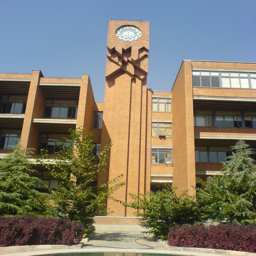

In [10]:
first_img

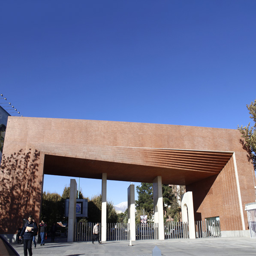

In [11]:
second_img

Convolutions have some interesting usages in image processing. For example, you can extract edges from an image by applying a convolution with a kernel that detects edges. Or you can convolve a specific kernel with your image to make it grayscale or blurred! Look at the definitions below:

__Edge Detection Kernel__:

_Sobel_ is one of the most famous edge detection kernels. It has two kernels, one for detecting vertical edges and the other for horizontal edges. You can see the kernels below:
$$
\text{Sobel}_x = \begin{bmatrix}
-1 & 0 & 1 \\
-2 & 0 & 2 \\
-1 & 0 & 1
\end{bmatrix}
$$

$$
\text{Sobel}_y = \begin{bmatrix}
-1 & -2 & -1 \\
0 & 0 & 0 \\
1 & 2 & 1
\end{bmatrix}
$$


__Grayscale Kernel__:

You can simply convolve the image with the following kernel to make it grayscale:

$$
\text{Grayscale\_across\_R} = \begin{bmatrix}
0 & 0 & 0 \\
0 & 0.3 & 0 \\
0 & 0 & 0
\end{bmatrix}
$$

$$
\text{Grayscale\_across\_G} = \begin{bmatrix}
0 & 0 & 0 \\
0 & 0.6 & 0 \\
0 & 0 & 0
\end{bmatrix}
$$

$$
\text{Grayscale\_across\_B} = \begin{bmatrix}
0 & 0 & 0 \\
0 & 0.1 & 0 \\
0 & 0 & 0
\end{bmatrix}
$$

(Convolve each kernel with its corresponding channel)

__Blurring Kernel__:

One of the famous kernels to blur an image is _Gaussian Blur_. You can see the kernel below:

$$
\text{Gaussian\_Blur} = \frac{1}{16} \times \begin{bmatrix}
1 & 2 & 1 \\
2 & 4 & 2 \\
1 & 2 & 1
\end{bmatrix}
$$


In [12]:
# Sobel Kernels
sobel_x = np.array([[-1, 0, 1],
                    [-2, 0, 2],
                    [-1, 0, 1]])

sobel_y = np.array([[-1, -2, -1],
                    [ 0,  0,  0],
                    [ 1,  2,  1]])

# Grayscale Kernels
grayscale_kernel_r = np.array([[0, 0, 0],
                               [0, 0.3, 0],
                               [0, 0, 0]])

grayscale_kernel_g = np.array([[0, 0, 0],
                               [0, 0.6, 0],
                               [0, 0, 0]])

grayscale_kernel_b = np.array([[0, 0, 0],
                               [0, 0.1, 0],
                               [0, 0, 0]])

# Gaussian Blur Kernel
gaussian_blur = np.array([[1, 2, 1],
                          [2, 4, 2],
                          [1, 2, 1]]) / 16.0


In [13]:
img_size = 256

x = np.zeros((2, 3, img_size, img_size))
x[0] = np.array(first_img).transpose(2, 0, 1)
x[1] = np.array(second_img).transpose(2, 0, 1)

# a convolution weight, holding 4 filters 3x3

w = np.zeros((4, 3, 3, 3))

# Assign kernels to filters
w[0, 0] = grayscale_kernel_r
w[0, 1] = grayscale_kernel_g
w[0, 2] = grayscale_kernel_b

w[1, 0] = sobel_x
w[1, 1] = sobel_x
w[1, 2] = sobel_x

w[2, 0] = sobel_y
w[2, 1] = sobel_y
w[2, 2] = sobel_y

w[3, 0] = gaussian_blur
w[3, 1] = gaussian_blur
w[3, 2] = gaussian_blur

b = np.array([0, 128, 128, 0])

conv = MyConv(stride=1, padding=1)
out = conv.forward(x, w, b)

In [14]:
import matplotlib.pyplot as plt
# Helper function to display images
def show_images(images, titles):
    n = len(images)
    plt.figure(figsize=(20, 10))
    for i in range(n):
        plt.subplot(1, n, i + 1)
        plt.imshow(images[i], cmap='gray')
        plt.title(titles[i])
        plt.axis('off')
    plt.show()

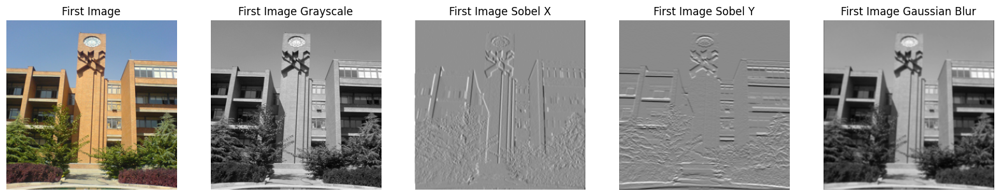

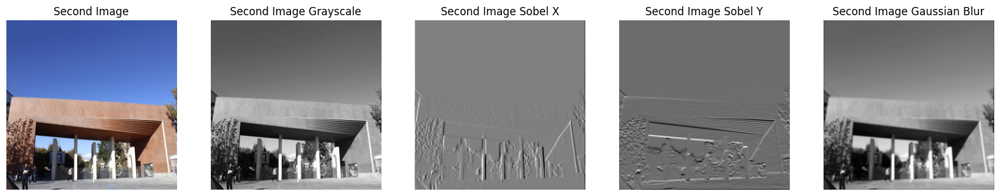

In [15]:
#TODO: Plot the original image, grayscale, sobel x, sobel y, and gaussian blur of each image

# Extract and transpose the outputs for visualization
first_img_grayscale = out[0, 0]
first_img_sobel_x = out[0, 1]
first_img_sobel_y = out[0, 2]
first_img_gaussian_blur = out[0, 3]

second_img_grayscale = out[1, 0]
second_img_sobel_x = out[1, 1]
second_img_sobel_y = out[1, 2]
second_img_gaussian_blur = out[1, 3]

show_images([np.array(first_img), first_img_grayscale, first_img_sobel_x, first_img_sobel_y, first_img_gaussian_blur],
            ['First Image', 'First Image Grayscale', 'First Image Sobel X', 'First Image Sobel Y', 'First Image Gaussian Blur'])

show_images([np.array(second_img), second_img_grayscale, second_img_sobel_x, second_img_sobel_y, second_img_gaussian_blur],
            ['Second Image', 'Second Image Grayscale', 'Second Image Sobel X', 'Second Image Sobel Y', 'Second Image Gaussian Blur'])




## Section 2: Neural Style Transfer (90 points)

In this part, we are going to implement a famous technique in the field of _Computer Vision_ called __Neural Style Transfer__. This technique is used to apply the style of a specific image to another image. For example, you can apply the style of a famous painting to your photo! Let's get started!

### 2.1 - Importing Libraries

In [16]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from PIL import Image
import matplotlib.pyplot as plt

import torchvision.transforms as transforms
from torchvision.models import vgg19, VGG19_Weights

import copy

In [17]:
device = torch.device(
    "cuda"
    if torch.cuda.is_available()
    else "mps" if torch.backends.mps.is_available() else "cpu"
)
torch.set_default_device(device)
device

device(type='cpu')

### 2.2 - Loading Images and doing some Preprocessing (5/90 pts)

In this part, you should load the content and style images and preprocess them. Preprocessing includes resizing the images to a specific size, normalizing them, and converting them to PyTorch tensors. You can use `torchvision.transforms` to do these tasks.

In [18]:
# Define the image size
img_size = 512 if not device == "cpu" else 256

#TODO: Implement some transformations for the images

# Define the transformations: resize to fixed size, convert to tensor, and normalize
transform = transforms.Compose([
    transforms.Resize((img_size, img_size)),  # Force both dimensions to be the same
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [19]:
#style_image = ... # It's in Images/Neural_Transfer/Style.jpeg
#content_image = ... # It's in Images/Neural_Transfer/Content.jpeg

# Load the style and content images
style_image_path = "./Images/Neural_Transfer/Style.jpeg"
content_image_path = "./Images/Neural_Transfer/Content.jpeg"

style_image = transform(Image.open(style_image_path)).unsqueeze(0).to(device)
content_image = transform(Image.open(content_image_path)).unsqueeze(0).to(device)

style_image.size(), content_image.size()

(torch.Size([1, 3, 512, 512]), torch.Size([1, 3, 512, 512]))

Here, you should implement a helper function to show you images (which are now in form of pytorch tensors) in the notebook. You can use `torchvision.transforms.ToPILImage` to convert a tensor to a PIL image.

In [20]:
#TODO

def imshow(tensor, title=None):
    # Reverse the normalization process
    unnormalize = transforms.Normalize(
        mean=[-2.12, -2.04, -1.80],
        std=[4.37, 4.46, 4.44]
    )
    
    image = tensor.cpu().clone()
    image = image.squeeze(0)
    image = unnormalize(image)
    image = torch.clamp(image, 0, 1)
    image = transforms.ToPILImage()(image)
    
    # Plot the image
    plt.imshow(image)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # Pause a bit so that plots are updated

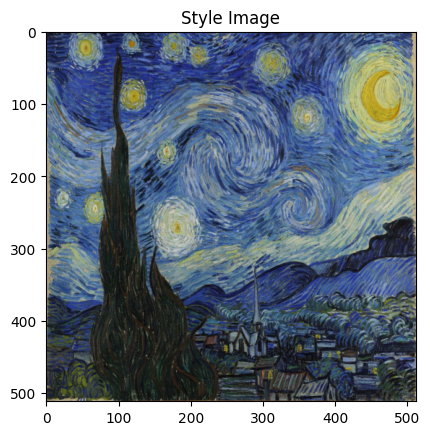

In [21]:
imshow(style_image, "Style Image")

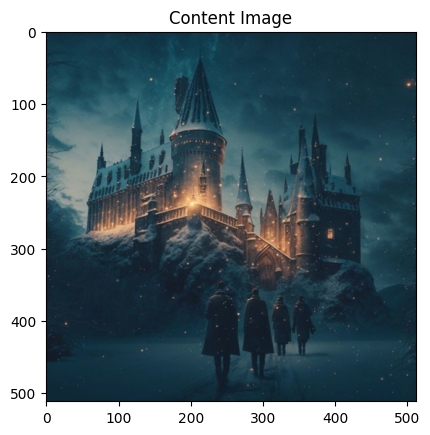

In [22]:
imshow(content_image, "Content Image")

### 2.2 - VGG19 Model (15/90 pts)

One of the important parts of Neural Style Transfer is to use a pre-trained model to extract features from the content and style images. Here, we are going to use a pre-trained VGG19 model to extract features from the images. You can use `torchvision.models.vgg19` to load the model. You should also freeze the weights of the model to prevent them from updating during the optimization process.

<div style="text-align:center;">
  <img src="./Images/VGG-19.png" />
</div>

But what is VGG model? Let's see with a simple experiment:

In [23]:
import certifi
import os

os.environ['SSL_CERT_FILE'] = certifi.where()

Here, please load `VGG19` model from `torchvision.models` and see the architecture of the model. You may need models `features` and `classifier` part stored seperately as we will discuss these both parts.

In [24]:
#TODO
import torch
from torchvision.models import vgg19, VGG19_Weights

# Load the VGG19 model
vgg = vgg19(weights=VGG19_Weights.DEFAULT).to(device).eval()

# Freeze the weights of the model
for param in vgg.parameters():
    param.requires_grad = False

# Extract the features and classifier parts
VGG_model_features = vgg.features
VGG_model_classifier = vgg.classifier

print(VGG_model_features)
print(VGG_model_classifier)

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

In [25]:
import torchsummary
from torchsummary import summary

#TODO: Print the summary of the vgg_model

summary(vgg, (3, img_size, img_size))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 512, 512]           1,792
              ReLU-2         [-1, 64, 512, 512]               0
            Conv2d-3         [-1, 64, 512, 512]          36,928
              ReLU-4         [-1, 64, 512, 512]               0
         MaxPool2d-5         [-1, 64, 256, 256]               0
            Conv2d-6        [-1, 128, 256, 256]          73,856
              ReLU-7        [-1, 128, 256, 256]               0
            Conv2d-8        [-1, 128, 256, 256]         147,584
              ReLU-9        [-1, 128, 256, 256]               0
        MaxPool2d-10        [-1, 128, 128, 128]               0
           Conv2d-11        [-1, 256, 128, 128]         295,168
             ReLU-12        [-1, 256, 128, 128]               0
           Conv2d-13        [-1, 256, 128, 128]         590,080
             ReLU-14        [-1, 256, 1

Please briefly explain what is a VGG model used for and what does each `features` and `classifier` part, represent?

**Your Answer:**

The VGG model, like VGG19, is used for recognizing and understanding images. It is commonly used in tasks like identifying objects in pictures or analyzing patterns.

#### Features Part:
The `features` part of the VGG19 model includes layers that look at the input image and find important features like edges, textures, and shapes. This part helps break down the image into understandable pieces. For example, in bioinformatics, it can be used to find details in medical images, like detecting the structure of cells or tissues.

#### Classifier Part:
The `classifier` part of the VGG19 model takes the features found by the `features` part and decides what the image is showing. It does this by using layers that make predictions based on the extracted features. In bioinformatics, this could mean classifying images into categories like healthy vs. diseased cells.

In short, the VGG19 model helps us understand what's in an image by first finding important features and then making predictions based on those features.

----------------------------------------------------------

Now, we are going to give a sample image `Images/Neural_Transfer/Car.jpeg` to the model, see the output for classification and also visualize the feature maps (outputs of each convolutional layer) to see what's going on!

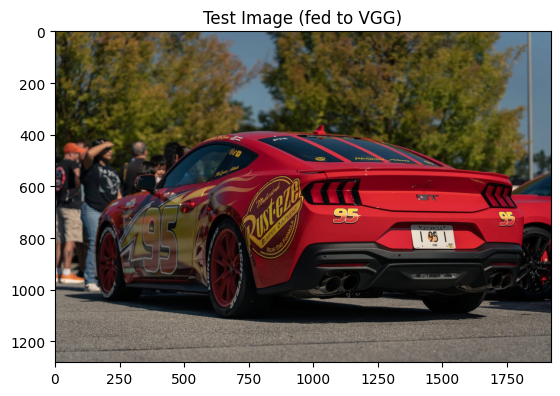

Model's classifier prediction: 817


In [26]:
vgg_test_image = Image.open("./Images/Neural_Transfer/Car.jpeg")

#TODO: Plot the image which we are feeding to the model

# Plot the test image
VGG_test_image = Image.open("./Images/Neural_Transfer/Car.jpeg")
plt.imshow(VGG_test_image)
plt.title("Test Image (fed to VGG)")
plt.show()


#TODO: required transformations for the input to the vgg model

# Define transformations for the test image
preprocess_vgg = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

#TODO: Predict the output of the vgg model for the test image (final classifier output and also each feature map output (in Conv2D layers))

# Apply the transformations to the test image
input_image = preprocess_vgg(VGG_test_image).unsqueeze(0).to(device)

# Forward pass through the model
output = vgg(input_image)

# Get the index of the highest score from the classifier output
_, predicted_class = output.max(1)
print(f"Model's classifier prediction: {predicted_class.item()}")

As you can see, the output of the classifier is an integer. This integer is actually the **class number** in _Image Net_ dataset. Let's get the name of the class:

In [27]:
import requests

class_idx = requests.get(
    "https://raw.githubusercontent.com/anishathalye/imagenet-simple-labels/master/imagenet-simple-labels.json"
).json()

# Get the class name
class_name = class_idx[predicted_class.item()]

print(f"Predicted class: {class_name}")

Predicted class: sports car


Now that we understood the architecture of VGG, and also the output of its classifier, it's time to extract features from the images! And see what's going on in the feature maps!

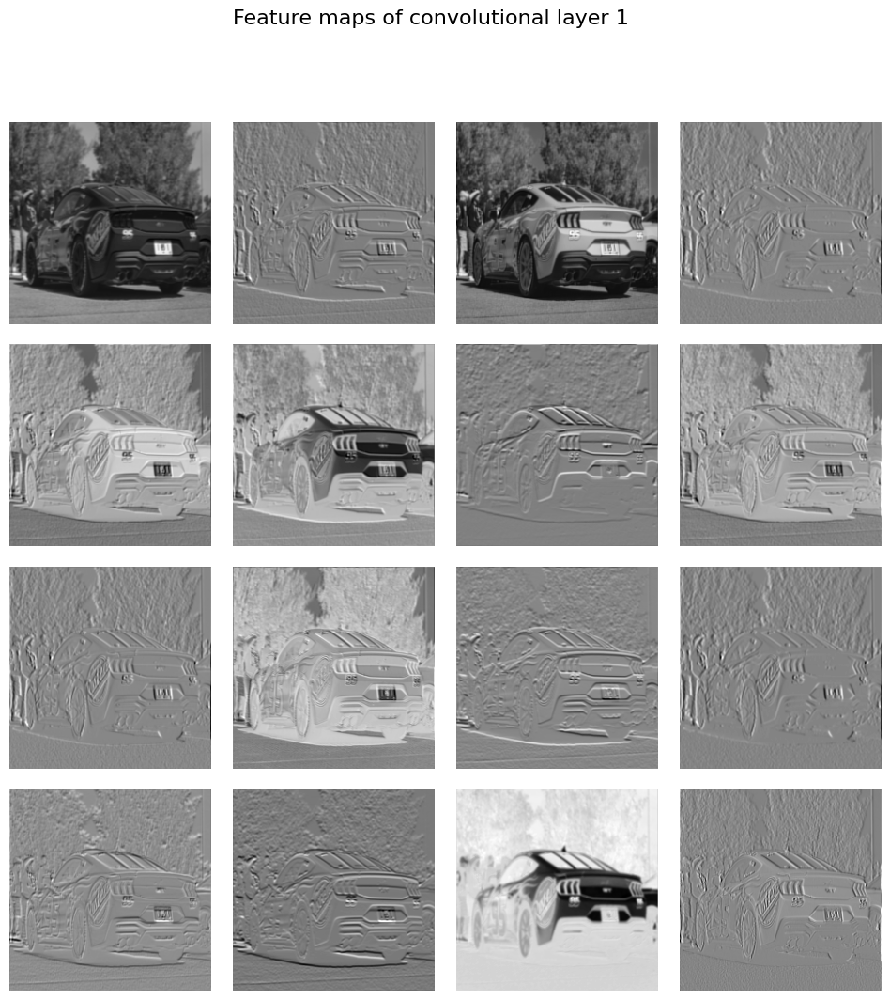

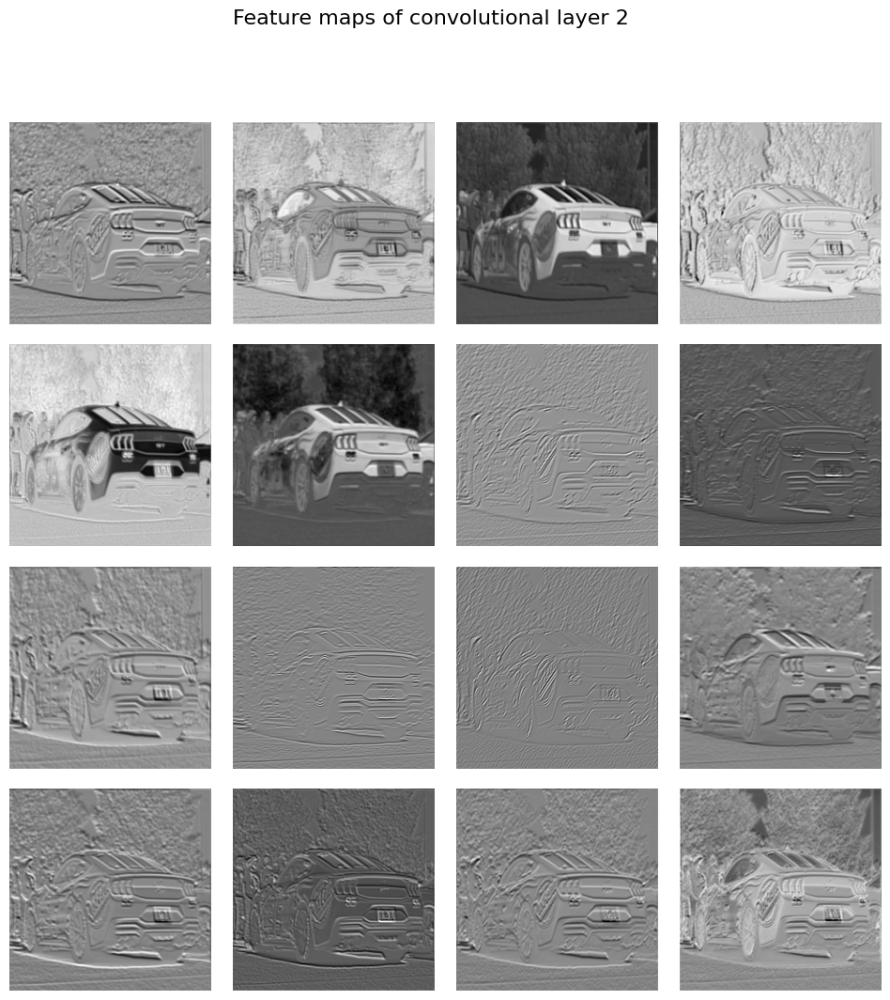

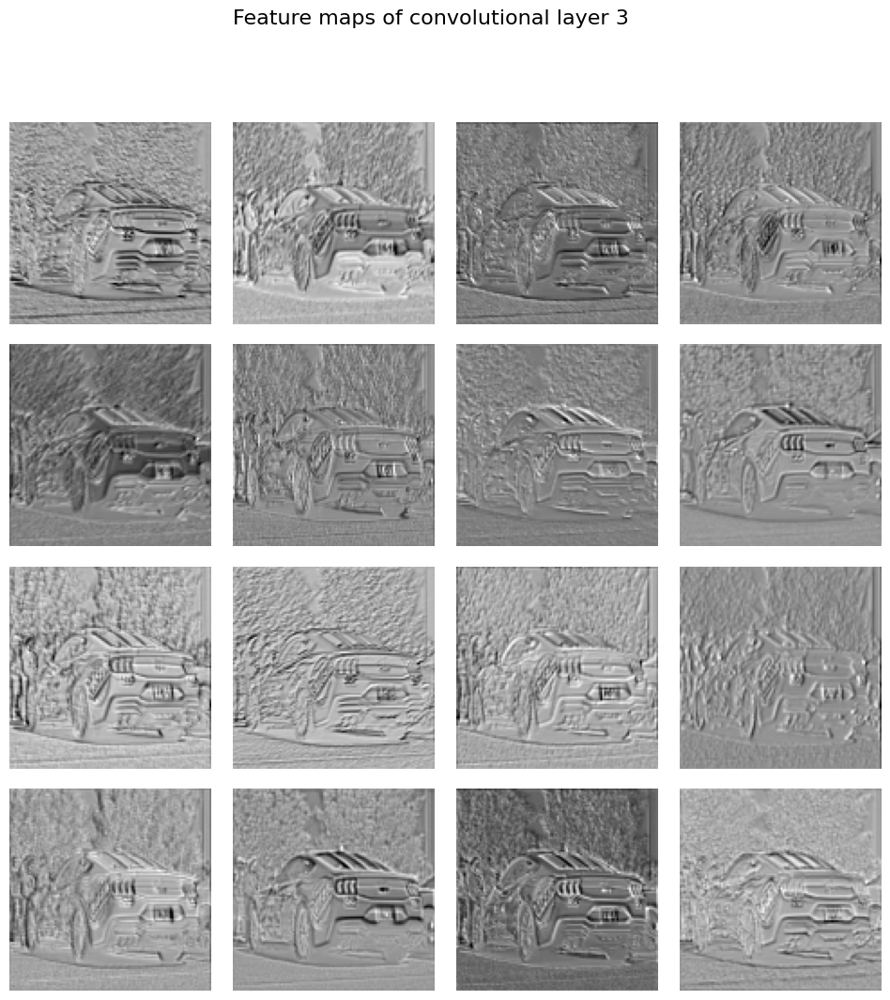

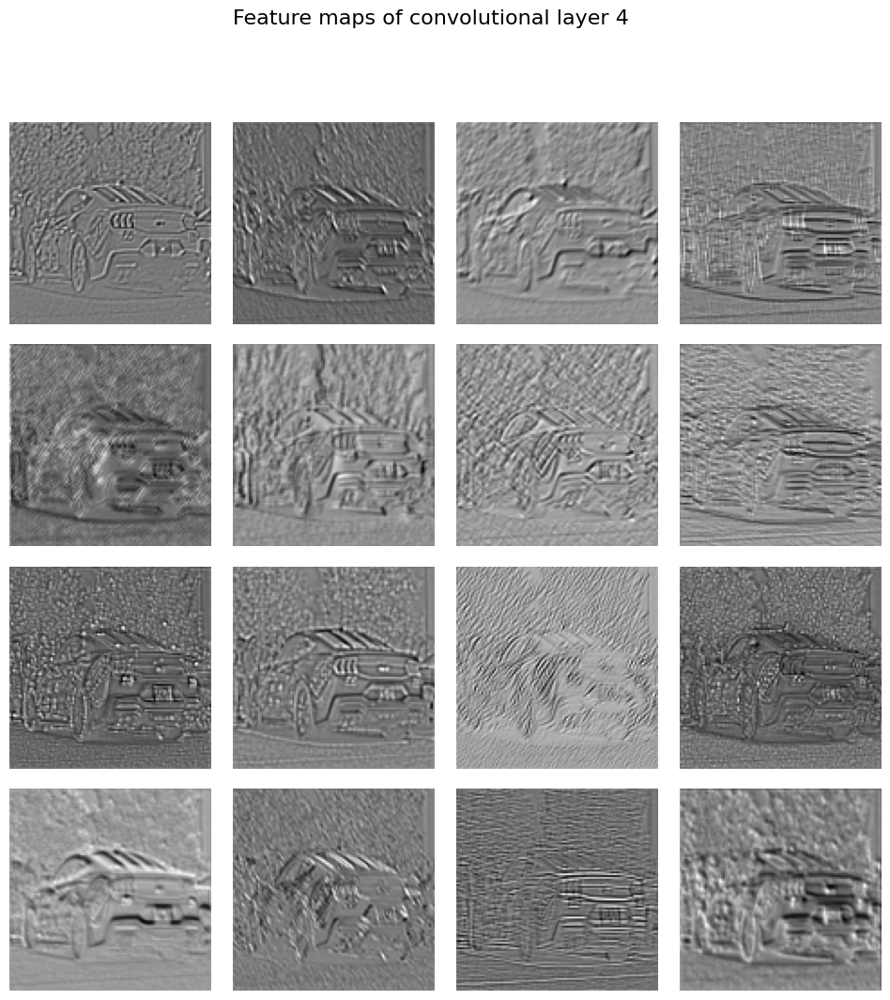

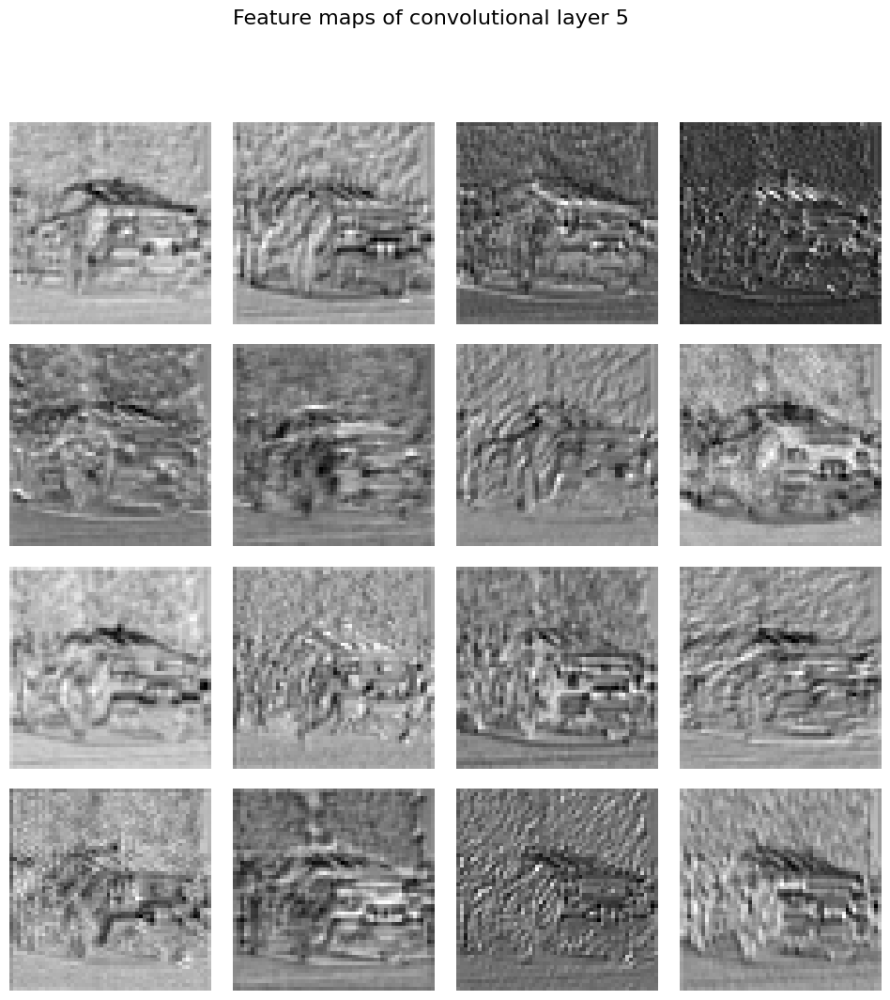

...

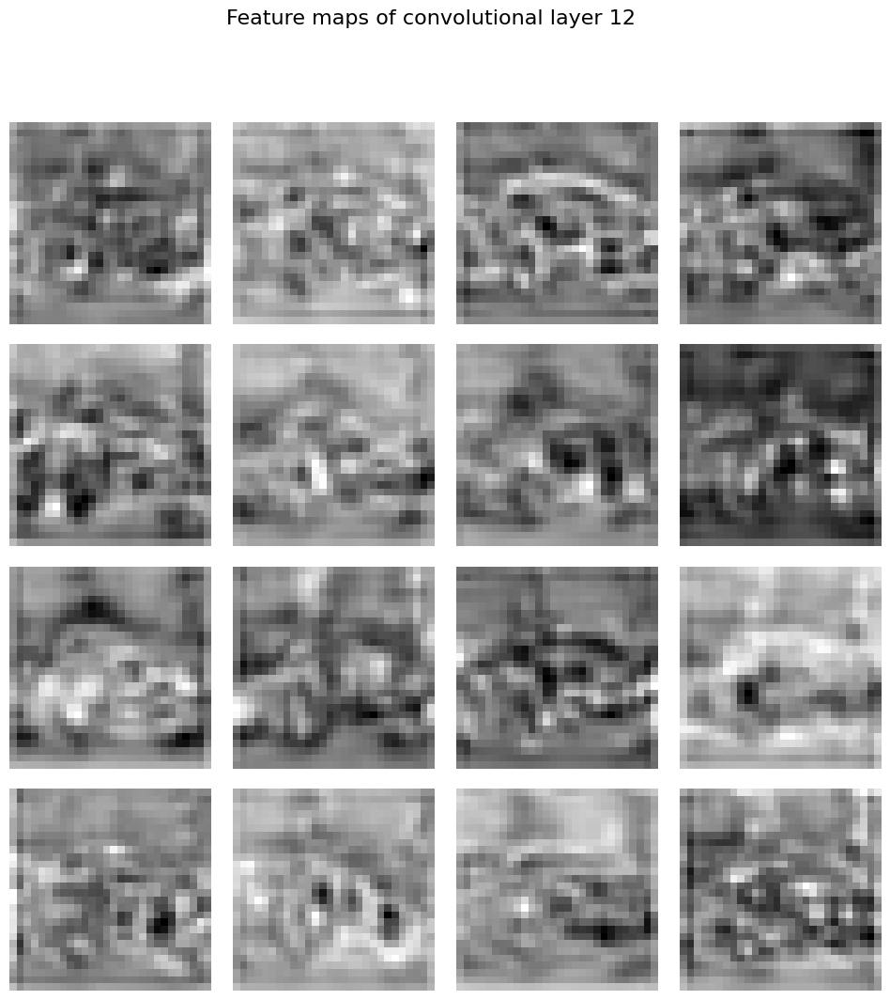

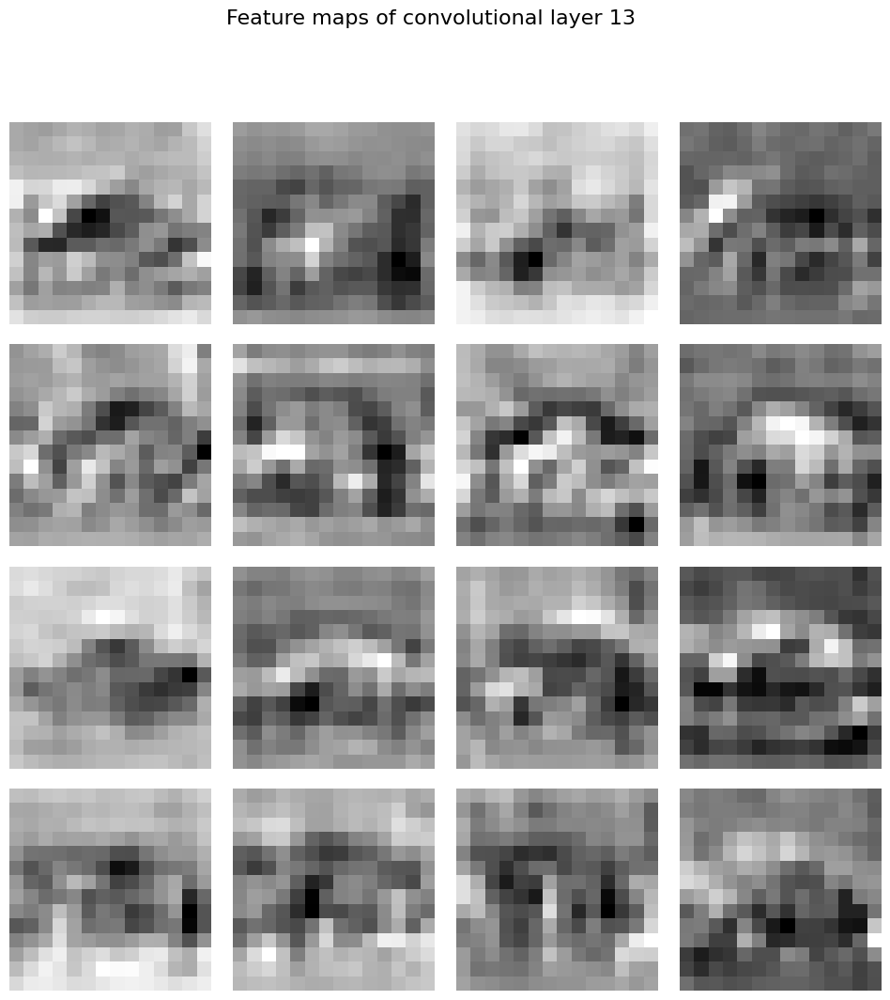

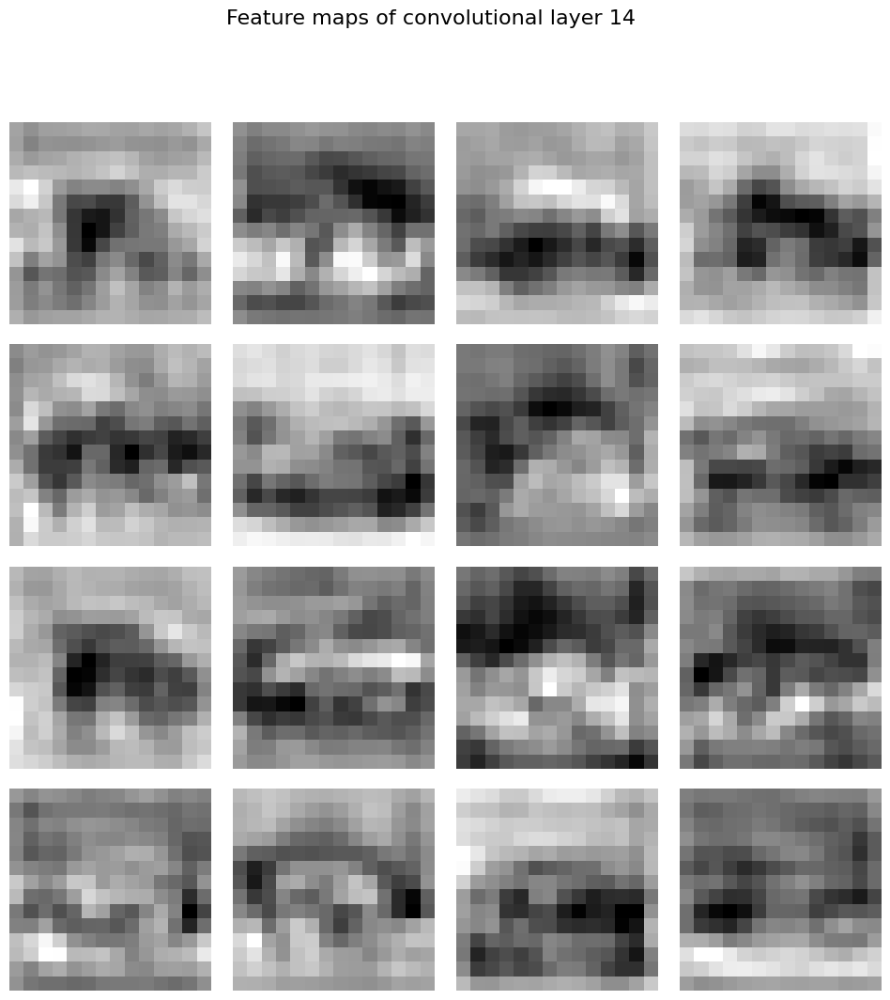

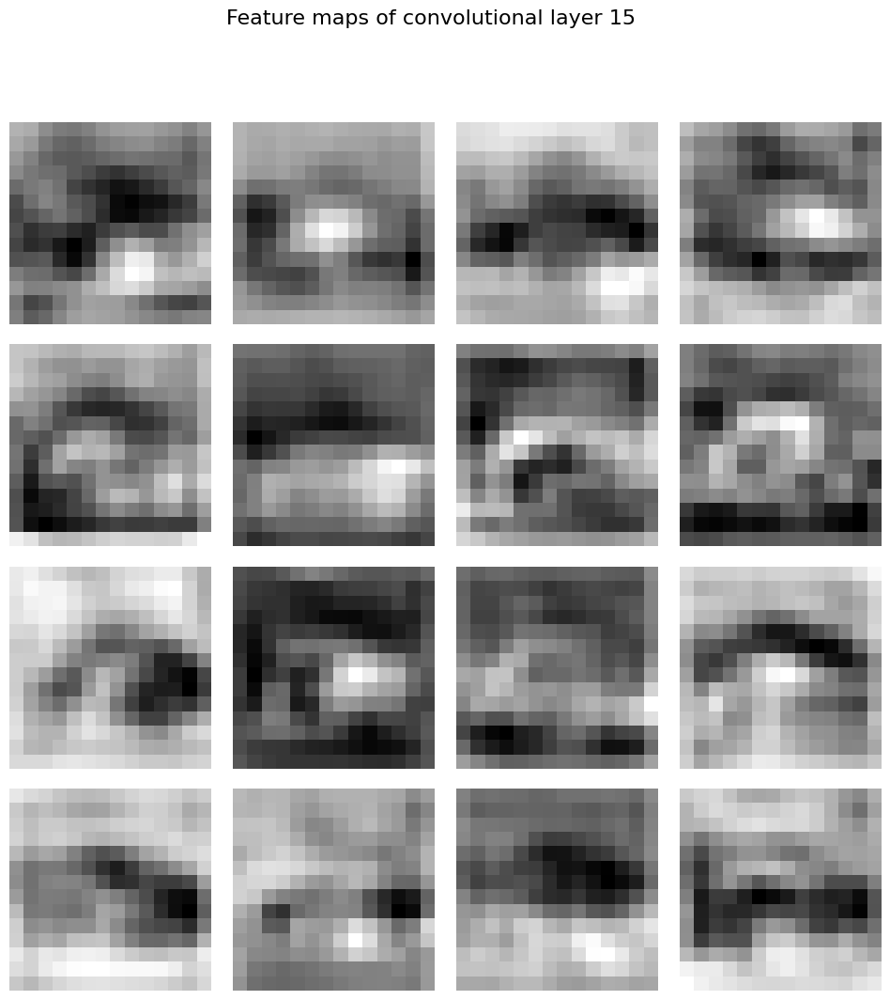

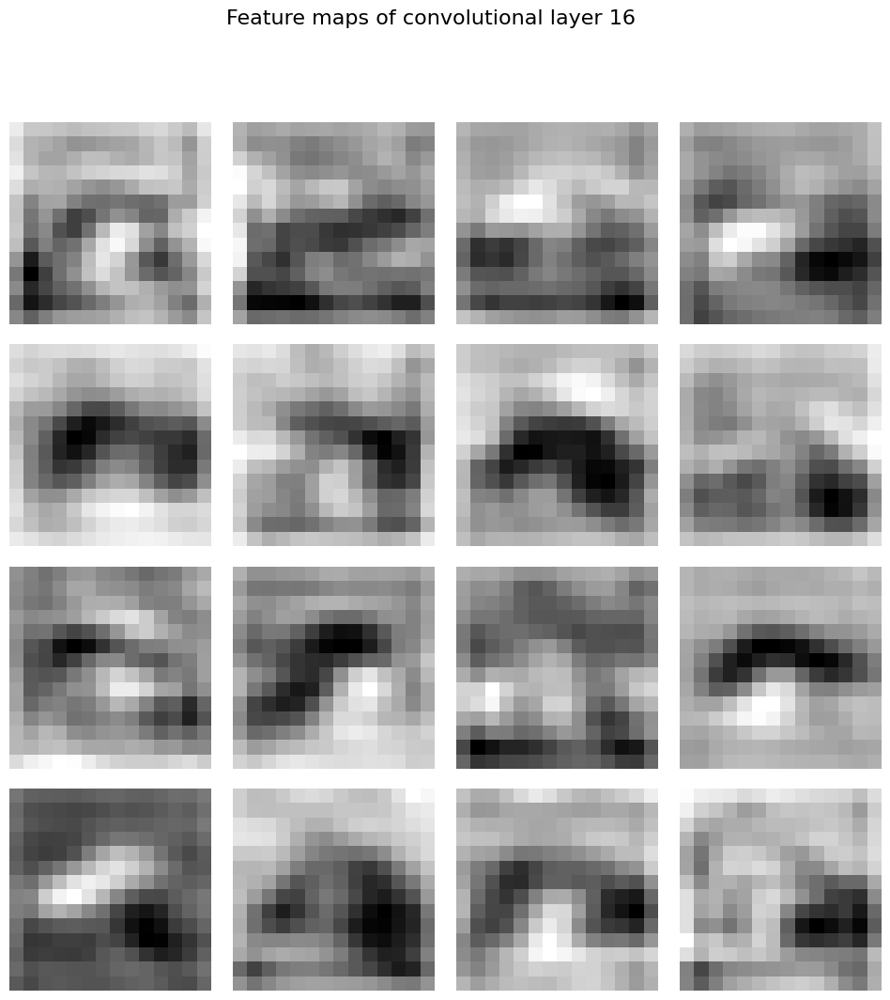

In [28]:
# Visualize the first 16 feature maps of each Conv2D layer (there are 16 Conv2D layers in VGG19)
#TODO

import matplotlib.pyplot as plt
import numpy as np


# Function to visualize feature maps
def visualize_feature_maps(model, input_image, num_conv_layers=16, num_feature_maps=16):
    x = input_image
    conv_layer_count = 0
    for layer in model.features:
        x = layer(x)
        if isinstance(layer, torch.nn.Conv2d):
            conv_layer_count += 1
            if conv_layer_count <= num_conv_layers:
                fig, axes = plt.subplots(4, 4, figsize=(12, 12))
                for idx in range(num_feature_maps):
                    row = idx // 4
                    col = idx % 4
                    feature_map = x[0, idx].cpu().detach().numpy()
                    # Normalize each feature map to [0, 1] range
                    feature_map = (feature_map - feature_map.min()) / (feature_map.max() - feature_map.min())
                    axes[row, col].imshow(feature_map, cmap='gray')
                    axes[row, col].axis('off')
                fig.suptitle(f'Feature maps of convolutional layer {conv_layer_count}', fontsize=16)
                plt.subplots_adjust(wspace=0.1, hspace=0.1)
                plt.show()
            else:
                break

# Apply the function to visualize the feature maps
visualize_feature_maps(vgg, input_image, num_conv_layers=16, num_feature_maps=16)



It's fun too look under the hood, isn't it? As you can see, we can guess what are the learned features in each layer if the network (at least in the first layers). For example, in the first layer, the network learns to detect edges, and in the second layer, it learns to detect simple shapes. In the deeper layers, the network learns to detect more complex features.

### 2.3 - Content and Style Loss (15/90 pts)

In order to learn the correct image and keep the content of the original image while applying the style of the seconf image, we need 2 losses: 1. Content Loss and 2. Style Loss. Let's delve into each one!

**Content Loss** is responsible for keeping the content of the original image. It is calculated as the mean squared error between the feature maps of the original image and the generated image.

In [29]:
import torch.nn as nn
import torch.nn.functional as F

In [30]:
class ContentLoss(nn.Module):
    def __init__(self, target):
        super(ContentLoss, self).__init__()
        #TODO
        
        self.target = target.detach()
        self.loss = F.mse_loss

    def forward(self, input):
        #TODO
        self.loss_value = self.loss(input, self.target)
        return input

**Style Loss** is responsible for applying the style of the second image to the generated image. It is calculated as the mean squared error between the Gram matrices of the feature maps of the second image and the generated image.

In [31]:
def gram_calculator(input):
    """
    Calculate the normalized Gram Matrix of a given input
    """
    # TODO
    
    batch_size, h, w, f_map_num = input.size()
    features = input.view(batch_size * h, w * f_map_num)
    G = torch.mm(features, features.t())
    return G.div(batch_size * h * w * f_map_num)

In [32]:
class StyleLoss(nn.Module):
    def __init__(self, target_feature):
        super(StyleLoss, self).__init__()
        # TODO

        self.target = gram_calculator(target_feature).detach()
        self.loss = F.mse_loss

    def forward(self, input):
        # TODO
        G = gram_calculator(input)
        self.loss_value = self.loss(G, self.target)
        return input

Now, we use `features` part of the VGG model to extract features from the content and style images. Then, we calculate the content and style loss using the extracted features.

In [33]:
#TODO: Get the `features` part of the VGG19 model

import torch
from torchvision.models import vgg19, VGG19_Weights

device = torch.device(
    "cuda"
    if torch.cuda.is_available()
    else "mps" if torch.backends.mps.is_available() else "cpu"
)
torch.set_default_device(device)

cnn = vgg19(weights=VGG19_Weights.DEFAULT).features.to(device).eval() 

In [34]:
cnn_normalization_mean = torch.tensor(
    [0.485, 0.456, 0.406]
)  # Normalization mean for the VGG19 model
cnn_normalization_std = torch.tensor(
    [0.229, 0.224, 0.225]
)  # Normalization std for the VGG19 model



# Normalize the images in order to feed it to the VGG19 model
class Normalization(nn.Module):
    def __init__(self, mean, std):
        super(Normalization, self).__init__()
        self.mean = torch.tensor(mean).view(-1, 1, 1)
        self.std = torch.tensor(std).view(-1, 1, 1)

    def forward(self, img):
        # normalize img
        return (img - self.mean) / self.std

cnn_normalization_mean = torch.tensor([0.485, 0.456, 0.406], device=device)
cnn_normalization_std = torch.tensor([0.229, 0.224, 0.225], device=device)

normalization = Normalization(cnn_normalization_mean, cnn_normalization_std).to(device)

C:\Users\Ali\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\utils\_device.py:78: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Please note that after which layers you should calculate the content loss and after which ones, you should calculate the style loss. Use the layer names you saw earlier in the `torchsummary` output for VGG19 model.

In [35]:
# TODO
# Content loss layers
content_layers_default = ['conv_4']

# TODO
# Style loss layers
style_layers_default = ['conv_1', 'conv_2', 'conv_3', 'conv_4', 'conv_5']

In [37]:
#TODO: any processes you want to add and/or helper functions

def get_style_model_and_losses(cnn, normalization_mean, normalization_std,
                               style_img, content_img,
                               content_layers=content_layers_default,
                               style_layers=style_layers_default):
    # Normalization module
    normalization = Normalization(normalization_mean, normalization_std).to(device)

    # Just in order to have an iterable access to the list of content/style losses
    content_losses = []
    style_losses = []

    # assuming that cnn is a nn.Sequential, so we make a new nn.Sequential
    # to put in modules that are supposed to be activated sequentially
    model = nn.Sequential(normalization)

    i = 0  # increment every time we see a conv
    for layer in cnn.children():
        if isinstance(layer, nn.Conv2d):
            i += 1
            name = 'conv_{}'.format(i)
        elif isinstance(layer, nn.ReLU):
            name = 'relu_{}'.format(i)
            # The in-place version doesn't play very nicely with the ContentLoss
            # and StyleLoss we insert below. So we replace with out-of-place ones here.
            layer = nn.ReLU(inplace=False)
        elif isinstance(layer, nn.MaxPool2d):
            name = 'pool_{}'.format(i)
        elif isinstance(layer, nn.BatchNorm2d):
            name = 'bn_{}'.format(i)
        else:
            raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))

        model.add_module(name, layer)

        if name in content_layers:
            # Add content loss:
            target = model(content_img).detach()
            content_loss = ContentLoss(target)
            model.add_module("content_loss_{}".format(i), content_loss)
            content_losses.append(content_loss)

        if name in style_layers:
            # Add style loss:
            target_feature = model(style_img).detach()
            style_loss = StyleLoss(target_feature)
            model.add_module("style_loss_{}".format(i), style_loss)
            style_losses.append(style_loss)

    # Now we trim off the layers after the last content and style losses
    for i in range(len(model) - 1, -1, -1):
        if isinstance(model[i], ContentLoss) or isinstance(model[i], StyleLoss):
            break

    model = model[:(i + 1)]

    return model, content_losses, style_losses


In [52]:
# Get the model and losses
model, content_losses, style_losses = get_style_model_and_losses(
    cnn, cnn_normalization_mean, cnn_normalization_std, style_image, content_image)

C:\Users\Ali\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torch\utils\_device.py:78: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


In [38]:
from PIL import Image
import torchvision.transforms as transforms
# Loading and Preprocessing Images

# Function to load an image and preprocess it
def image_loader(image_name):
    image = Image.open(image_name)
    loader = transforms.Compose([
        transforms.Resize((128, 128)),  # Resize the image to 128x128 (you can change this)
        transforms.ToTensor()])  # Transform the image to a tensor
    image = loader(image).unsqueeze(0)  # Add a batch dimension
    return image.to(device, torch.float)

# Load your images
content_img = image_loader("./Images/Neural_Transfer/Content.jpeg")
style_img = image_loader("./Images/Neural_Transfer/style.jpeg")

assert content_img.size() == style_img.size(), "Content and style images must be of the same size"

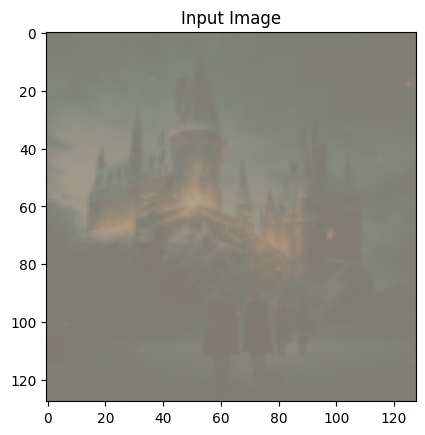

In [43]:
import matplotlib.pyplot as plt
# Plot the input image to the model
# TODO

# Plot the input image
input_img = content_img
#input_img = content_img.clone()
plt.figure()
imshow(input_img, title='Input Image')
plt.show()



(15/90 pts) Now, we need to define our optimizer. We use `LBFGS` optimizer. Let's get familiar with this optimizer a little bit:

Let's use this optimizer to optimize a simple function $f(x) = x^2$. We want to find the minimum of this function using `LBFGS` optimizer. First, you should initialize a tensor $x$ with a random value. Then, you should define a closure function that calculates the value of the function and its gradient. Finally, you should use the `step` method of the optimizer to update the value of $x$.

And lastly, you should generate an animation using `matplotlib.animation` to show how the value of $x$ changes during optimization.

In [44]:
import matplotlib.animation as animation
from torch.optim import LBFGS
import IPython.display as display

In [45]:
# TODO: Define a simple quadratic function
import torch
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from torch.optim import LBFGS
import IPython.display as display

# Define the quadratic function
def f(x):
    return x**2

In [46]:
# Initialize a tensor with a single random value (e.g. 5.0/7.0/10.0/...)
x = torch.tensor([5.0], requires_grad=True)

import torch.optim as optim
# Define the LBFGS optimizer
optimizer = optim.LBFGS([x], lr=0.1)

In [47]:
# List to store the values of x during optimization
x_values = []

# Define the closure function
def closure():
    optimizer.zero_grad()  # Clear the gradients
    loss = f(x)            # Compute the loss
    loss.backward()        # Compute the gradient
    x_values.append(x.item())
    return loss

In [48]:
#TODO: Implement the optimization loop and animate the results

# Perform the optimization loop
for _ in range(100):  # Perform 20 iterations
    optimizer.step(closure)


In [49]:
from IPython.display import HTML, display

# Create the figure and axis for the animation
fig, ax = plt.subplots()
x_range = torch.linspace(-5, 5, 100)

line, = ax.plot([], [], 'r-', linewidth=2)  # Line plot for the quadratic function
point, = ax.plot([], [], 'bo', markersize=8)  # Larger blue dot

ax.set_xlim(-5, 5)
ax.set_ylim(0, 25)
ax.set_xlabel('x')
ax.set_ylabel('f(x)')
ax.set_title('Optimization of f(x) = x^2')

# Define the initialization function
def init():
    line.set_data([], [])
    point.set_data([], [])
    return line, point

# Define the update function for the animation
def update(i):
    x_val = x_values[i]
    y_val = f(torch.tensor([x_val])).item()
    
    x_range = torch.linspace(-5, 5, 100)
    y_range = f(x_range)
    
    line.set_data(x_range.numpy(), y_range.numpy())
    point.set_data([x_val], [y_val])
    return line, point

# Create the animation using FuncAnimation
ani = animation.FuncAnimation(fig, update, frames=range(len(x_values)), init_func=init, blit=True, repeat=False)

# Save the animation as a gif
ani.save('optimization_animation.gif', writer='imagemagick')

# Display the animation
plt.close(fig)  # Prevent initial static image
display(HTML(ani.to_jshtml()))

MovieWriter imagemagick unavailable; using Pillow instead.


In [31]:
import matplotlib.animation as animation
from torch.optim import LBFGS
import IPython.display as display


# TODO: Define a simple quadratic function
...


# Initialize a tensor with a single random value (e.g. 5.0/7.0/10.0/...)
x = ...

optimizer = ...

#TODO: Implement the optimization loop and animate the results
...

(35/90 pts) Now, let's use this optimizer to optimize our `input_image` to minimize the content and style loss. You should define a closure function that calculates the content and style loss and their gradients. Then, you should use the `step` method of the optimizer to update the value of the `input_image`. Please also **note** that you should use a weighted sum of the content and style loss to optimize the input image. (weight of each loss is a hyperparameter)

  0%|          | 0/300 [00:00<?, ?it/s]

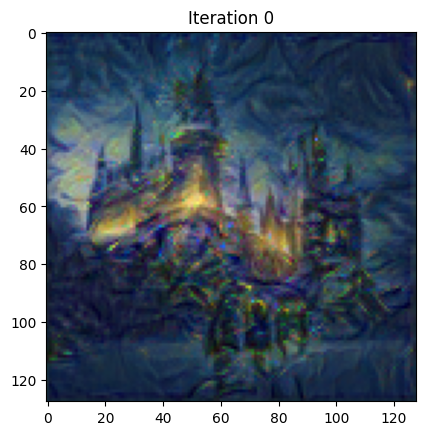

 17%|█▋        | 50/300 [00:55<04:34,  1.10s/it]

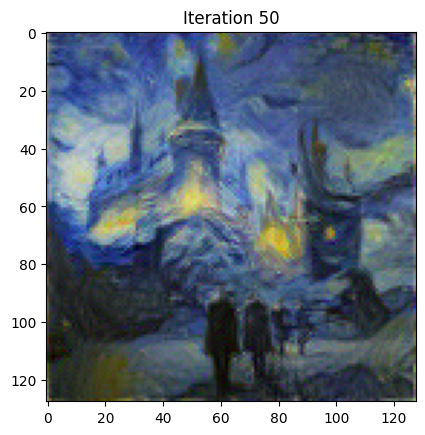

 33%|███▎      | 100/300 [01:50<03:40,  1.10s/it]

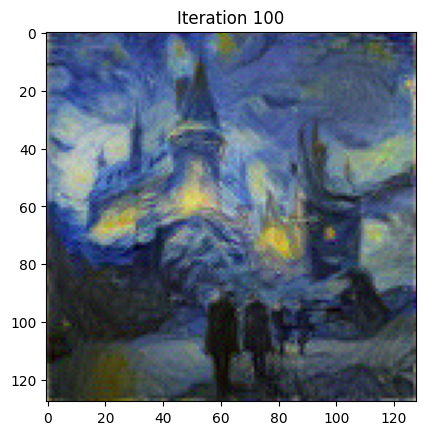

 50%|█████     | 150/300 [02:45<02:52,  1.15s/it]

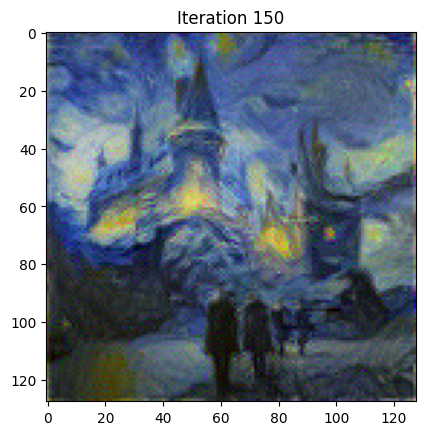

 67%|██████▋   | 200/300 [03:41<01:54,  1.15s/it]

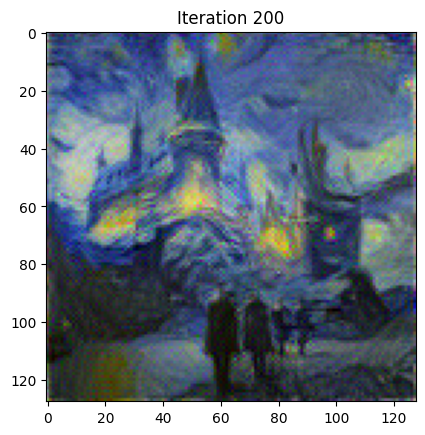

 83%|████████▎ | 250/300 [04:40<00:59,  1.18s/it]

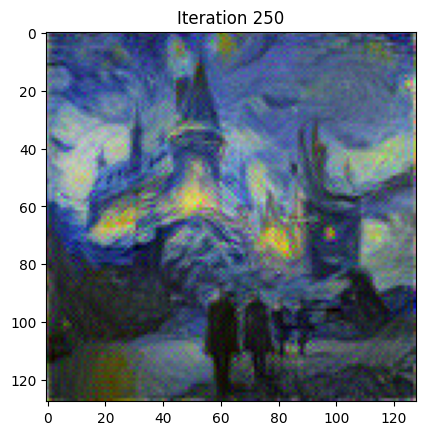

100%|██████████| 300/300 [05:40<00:00,  1.13s/it]


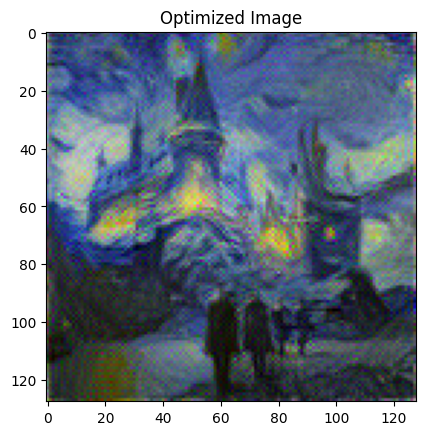

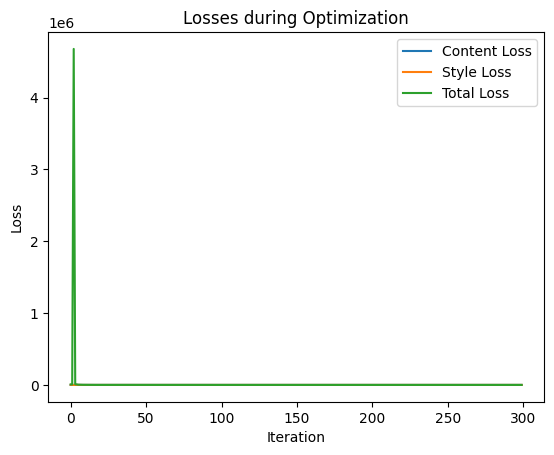

In [71]:
# Train your model using LBFGS optimizer and 2 implemented losses (style loss and content loss)
# You should report the `style loss`, `content loss`, and `total loss` for each iteration. Note that `total loss`
# is the sum of `style loss` and `content loss` with some weights (alpha and beta) which you should tune them.
# Also, please plot the image each 50 iterations.
# An important note is that your optimizer might change the values of the image tensor in a way that the pixel values
# are no longer in the range of [0, 1] (in normalized format). So, you should clip the values of the image tensor
# to be in the range of [0, 1] after each iteration, to prevent any problems occuring to your image.
# TODO

import torch
import torch.optim as optim
import matplotlib.pyplot as plt
from tqdm import tqdm  # For progress bar

# Define the weights for content and style losses
alpha = 1.0  # Weight for content loss
beta = 1e6   # Weight for style loss

# Initialize the input image as a clone of the content image
input_image = content_img.clone().requires_grad_(True)

# Define the optimizer
optimizer = optim.LBFGS([input_image], lr=1.0)

# Define a list to store the losses
content_losses_list = []
style_losses_list = []
total_losses_list = []

# Define the closure function
def closure():
    optimizer.zero_grad()  # Clear the gradients

    model(input_image)  # Forward pass through the model

    content_loss_value = sum(cl.loss_value for cl in content_losses)
    style_loss_value = sum(sl.loss_value for sl in style_losses)
    total_loss = alpha * content_loss_value + beta * style_loss_value

    total_loss.backward()  # Compute the gradients

    # Clip the pixel values to be in the range [0, 1]
    with torch.no_grad():
        input_image.clamp_(0, 1)

    # Store the losses if within iteration limit
    if len(content_losses_list) < num_iterations:
        content_losses_list.append(content_loss_value.item())
        style_losses_list.append(style_loss_value.item())
        total_losses_list.append(total_loss.item())

    return total_loss

# Function to show an image
def imshow(tensor, title=None):
    image = tensor.cpu().clone()  # Clone the tensor to not modify the original image
    image = image.squeeze(0)      # Remove the batch dimension
    image = transforms.ToPILImage()(image)  # Convert tensor to PIL image
    plt.imshow(image)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # Pause a bit so that plots are updated

# Perform the optimization loop
num_iterations = 300
for i in tqdm(range(num_iterations)):
    optimizer.step(closure)
    if i % 50 == 0:  # Plot every 50 iterations
        plt.figure()
        imshow(input_image, title=f'Iteration {i}')
        plt.show()

# Plot the final image
plt.figure()
imshow(input_image, title='Optimized Image')
plt.show()

# Plot the losses
plt.figure()
plt.plot(content_losses_list, label='Content Loss')
plt.plot(style_losses_list, label='Style Loss')
plt.plot(total_losses_list, label='Total Loss')
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.legend()
plt.title('Losses during Optimization')
plt.show()


Now, let's see the result of optimization process on our `input_image`.

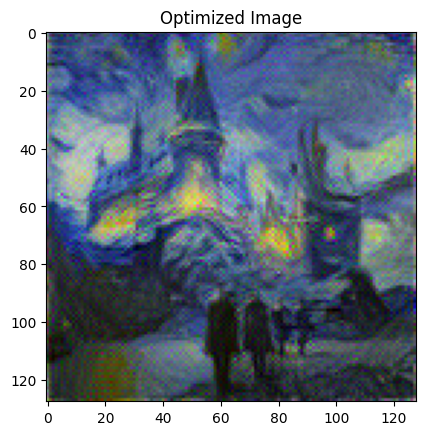

In [63]:
# TODO: Plot the final image
# Plot the final image
plt.figure()
imshow(input_image, title='Optimized Image')
plt.show()

(5/90 pts) Also, let's plot our `style_losses`, `content_losses` and `total_losses` to see how they change during the optimization process.

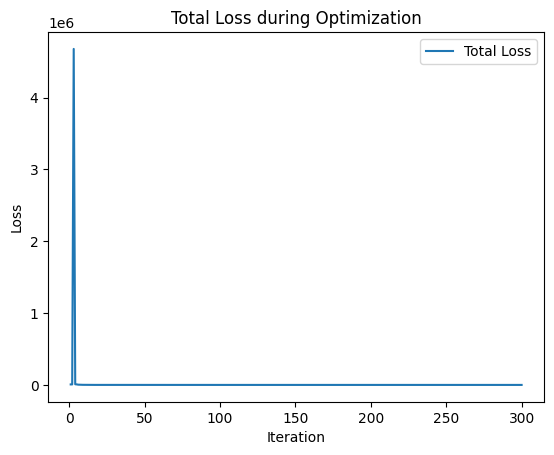

In [72]:
#TODO: Plot the total weighted loss w.r.t. the iteration number
plt.figure()
plt.plot(range(1, num_iterations + 1), total_losses_list, label='Total Loss')
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.legend()
plt.title('Total Loss during Optimization')
plt.show()

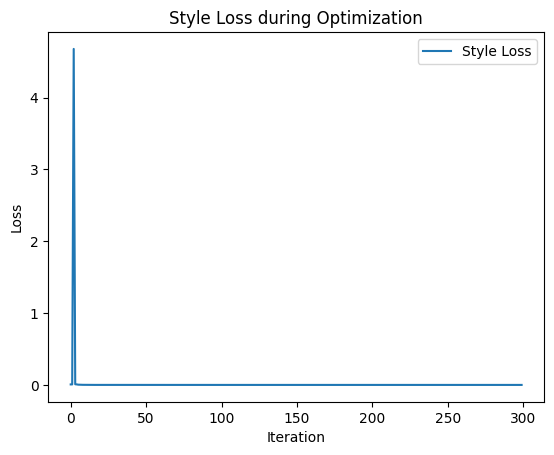

In [73]:
# TODO: Plot the style loss w.r.t. the iteration number
plt.figure()
plt.plot(style_losses_list, label='Style Loss')
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.legend()
plt.title('Style Loss during Optimization')
plt.show()

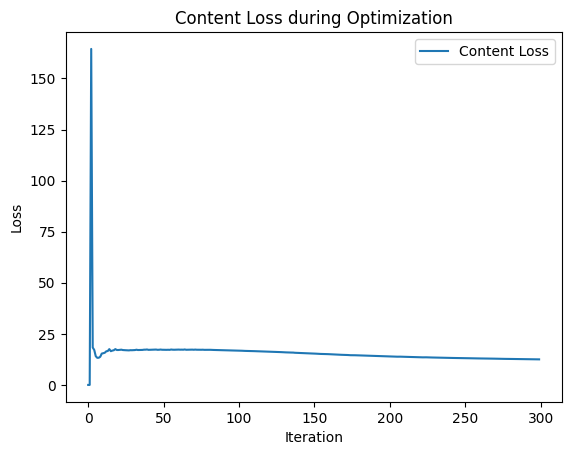

In [74]:
# TODO: Plot the content loss w.r.t. the iteration number

plt.figure()
plt.plot(content_losses_list, label='Content Loss')
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.legend()
plt.title('Content Loss during Optimization')
plt.show()